In [1]:
import json
import os

with open('/Users/marie/Documents/github/config.json', 'r') as f:
    config = json.load(f)

    for key in config:
        os.environ[key] = config[key]

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
# ! pip install langchain-openai --upgrade

In [4]:
import langchain_openai
import pandas as pd
from langchain_openai import OpenAIEmbeddings
import tqdm

In [5]:
import plotly.express as px
import plotly
import plotly.io as pio
pio.templates.default = 'simple_white'

In [6]:
pd.set_option('display.max_colwidth', 5000)

# Load data

In [7]:
df = pd.read_csv('sample_stack_exchange_data.csv', sep = '\t')

In [8]:
df.shape[0]

1400

In [9]:
df.topic.value_counts()

topic
ai                100
coffee            100
astronomy         100
pets              100
politics          100
bioinformatics    100
genai             100
bicycles          100
travel            100
fitness           100
chess             100
economics         100
datascience       100
movies            100
Name: count, dtype: int64

In [10]:
df.sample(5)

,full_text,topic,tokens
935,"Why are my knees hurting after a treadmill run?\nI am trying to get back in shape and started running. After a few runs (treadmill at the gym) both my knees are really hurting. \n\nIs this due to a lack of stretching?\nIs this overcompensating for weakness in other muscles ? \n\nWhat would i be doing that would make my knees hurt. I have run in the past and never had this specific pain.\nAlso, is there any recommendation to heal from this. I have stopped running for 3 days and my knees still hurt even when walking or going up stairs, etc.\nIf it is weakness in other leg muscles I would appreciate any exercise suggestions\n",fitness,141
1308,"Who was Kylo Ren fighting against in order to acquire the first location cube?\nIn the initial fighting scene of Star Wars: The Rise of Skywalker, Kylo Ren (with his own contingent of Stormtroopers) were fighting a group of people in order to acquire the first location cube that would lead him to Palpatine.\nWho were those people he was fighting?\n",movies,74
781,"Can I put downhill fork on any 29"" bike\nMy friend has an X-fact bike made for 29"" wheels, so we were wondering if he could put a downhill fork on it or he would need to buy a new frame?\n",bicycles,50
1252,"Pandas to_sql insert only some columns\nI am new using pandas. \nI am asking about how to insert specific columns using to_sql. \nThis is my explanation.\nI have a database with a table datasiswa with columns:\n\nid: as int, with autoincrement, as primary key\nname: string\nage: string\n\nAnd I have an excel file with header name and age.\nHow to use to_sql to insert in fields name and age only, without ids.\n\n",datascience,97
457,"What is Pro-Europeanism?\nI was reading a list of some political parties and one of them supports the idea of ""Pro-Europeanism"". What is that and is it supported by a lot of people?\n",politics,43


# Calculating embeddings 

In [20]:
from openai import OpenAI
client = OpenAI()

def get_embedding(text, model="text-embedding-3-small"):
   text = text.replace("\n", " ")
   return client.embeddings.create(input = [text], model=model).data[0].embedding

In [21]:
len(get_embedding('Hello'))

1536

In [22]:
%%time 

df['embedding'] = df.full_text.map(
    lambda x: get_embedding(x)
)

CPU times: user 10.4 s, sys: 869 ms, total: 11.3 s
Wall time: 5min 39s


In [23]:
df['id'] = list(map(
    lambda x: x + 1,
    range(df.shape[0])
))

In [24]:
# df.embedding.map(lambda x: len(x))

In [25]:
df.to_csv('sample_stack_exchange_data_with_emb_new.csv', sep = '\t', index = False)

# Visualising embeddings 
## PCA

In [26]:
df = pd.read_csv('sample_stack_exchange_data_with_emb_new.csv', sep = '\t')

In [27]:
df['embedding'] = df.embedding.map(lambda x: eval(x))

In [28]:
from sklearn.decomposition import PCA

# Perform PCA for 2D visualization
pca_model = PCA(n_components = 2)

In [29]:
import numpy as np
embeddings_array = np.array(df.embedding.values.tolist())
embeddings_array.shape

(1400, 1536)

In [30]:
pca_model.fit(embeddings_array)

PCA(n_components=2)

In [31]:
pca_embeddings_values = pca_model.transform(embeddings_array)

In [32]:
pca_embeddings_values.shape

(1400, 2)

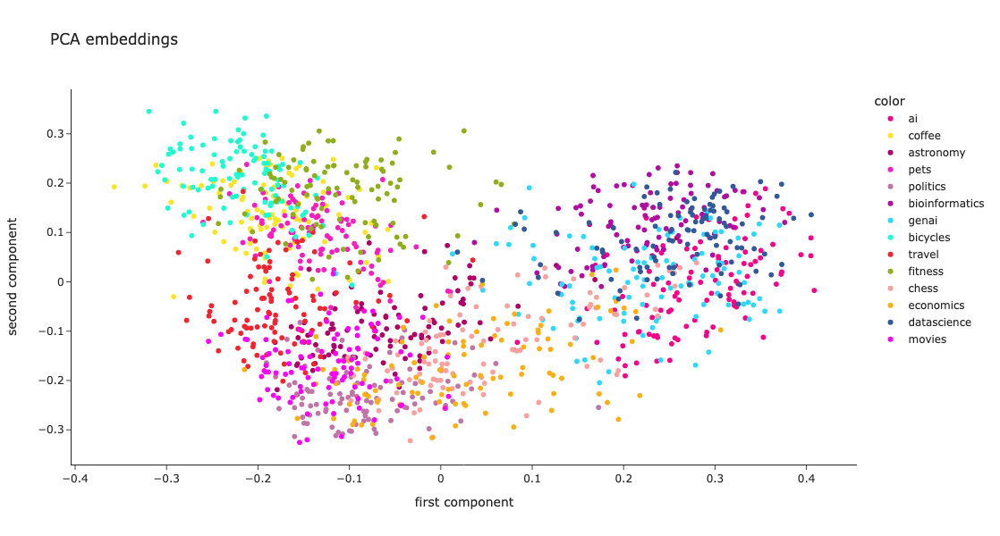

In [33]:
fig = px.scatter(
    x = pca_embeddings_values[:,0], 
    y = pca_embeddings_values[:,1],
    color = df.topic.values,
    hover_name = df.full_text.values,
    title = 'PCA embeddings', width = 800, height = 600,
    color_discrete_sequence = plotly.colors.qualitative.Alphabet_r
)

fig.update_layout(xaxis_title = 'first component', yaxis_title = 'second component')
fig.show()

## t-SNE

In [34]:
from sklearn.manifold import TSNE

In [35]:
tsne_model = TSNE(n_components=2, random_state=42)

In [36]:
%%time
tsne_embeddings_values = tsne_model.fit_transform(embeddings_array)

CPU times: user 35.9 s, sys: 7.03 s, total: 43 s
Wall time: 5.8 s


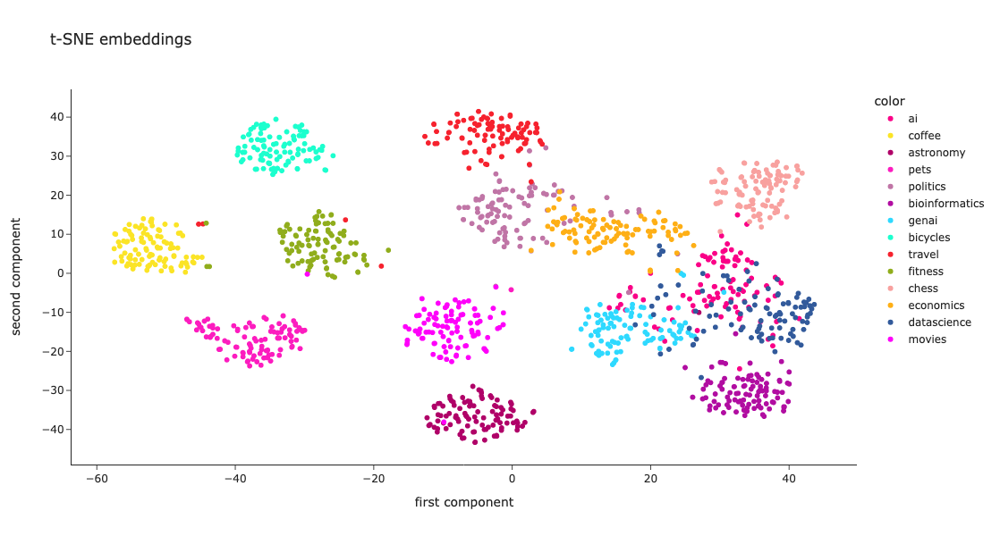

In [37]:
fig = px.scatter(
    x = tsne_embeddings_values[:,0], 
    y = tsne_embeddings_values[:,1],
    color = df.topic.values,
    hover_name = df.full_text.values,
    title = 't-SNE embeddings', width = 800, height = 600,
    color_discrete_sequence = plotly.colors.qualitative.Alphabet_r
)
fig.update_layout(xaxis_title = 'first component', yaxis_title = 'second component')
fig.show()

In [38]:
tsne_model_3d = TSNE(n_components=3, random_state=42)

In [39]:
%%time
tsne_3d_embeddings_values = tsne_model_3d.fit_transform(embeddings_array)

CPU times: user 44 s, sys: 8.91 s, total: 53 s
Wall time: 7.11 s


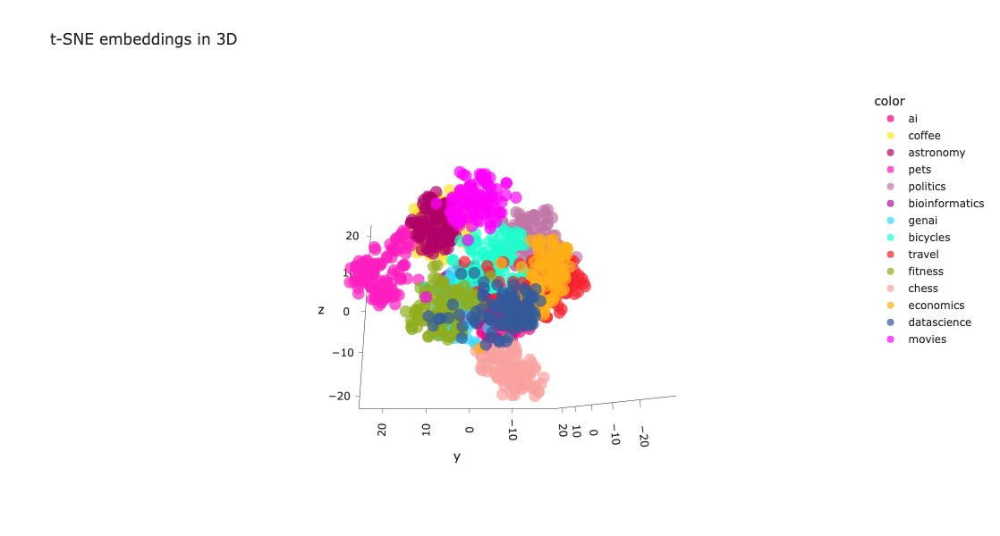

In [40]:
fig = px.scatter_3d(
    x = tsne_3d_embeddings_values[:,0], 
    y = tsne_3d_embeddings_values[:,1],
    z = tsne_3d_embeddings_values[:,2],
    color = df.topic.values,
    hover_name = df.full_text.values,
    title = 't-SNE embeddings in 3D', width = 800, height = 600,
    color_discrete_sequence = plotly.colors.qualitative.Alphabet_r,
    opacity = 0.7
)
fig.update_layout(xaxis_title = 'first component', yaxis_title = 'second component')
fig.show()

# Distances

### Examples

In [41]:
embedding = df.iloc[0].embedding

In [42]:
np.linalg.norm(embedding)

1.0000000189974265

In [107]:
vector1 = [1, 4]
vector2 = [2, 2]

In [108]:
sum(list(map(
    lambda x, y: (x - y) ** 2,
    vector1, 
    vector2
))) ** 0.5

2.23606797749979

In [109]:
np.linalg.norm((np.array(vector1) - np.array(vector2)), ord = 2)

2.23606797749979

In [110]:
def get_l2_distance(vector1, vector2):
    return np.linalg.norm((np.array(vector1) - np.array(vector2)), ord = 2)

In [111]:
sum(list(map(
    lambda x, y: abs(x - y),
    vector1, 
    vector2
)))

3

In [112]:
np.linalg.norm((np.array(vector1) - np.array(vector2)), ord = 1)

3.0

In [49]:
def get_l1_distance(vector1, vector2):
    return np.linalg.norm((np.array(vector1) - np.array(vector2)), ord = 1)

In [50]:
sum(list(map(
    lambda x, y: x*y,
    vector1, 
    vector2
)))

11

In [51]:
np.dot(vector1, vector2)

11

In [52]:
def get_dot_product(vector1, vector2):
    return np.dot(vector1, vector2)

In [130]:
dot_product = sum(list(map(
    lambda x, y: x*y,
    vector1, 
    vector2
)))

norm1 = sum(list(map(lambda x: x ** 2, vector1))) ** 0.5
norm2 = sum(list(map(lambda x: x ** 2, vector2))) ** 0.5

dot_product/norm1/norm2

0.8574929257125442

In [131]:
dot_product,norm1, norm2

(10, 4.123105625617661, 2.8284271247461903)

In [133]:
from sklearn.metrics.pairwise import cosine_similarity

cosine_similarity(np.array(vector1).reshape(1, -1) , np.array(vector2).reshape(1, -1))[0][0]

0.8574929257125441

In [134]:
def get_cosine_similarity(vector1, vector2):
    return cosine_similarity(np.array(vector1).reshape(1, -1) , np.array(vector2).reshape(1, -1))[0][0]

In [135]:
import math

In [136]:
math.acos(0.8574929257125441) / math.pi * 180

30.963756532073536

In [137]:
math.degrees(math.acos(0.8574929257125441))

30.963756532073536

In [150]:
get_cosine_similarity((1, 1), (1, 1))

0.9999999999999998

### Looking at clusters

In [56]:
df = df.set_index('id')

In [57]:
tmp_data = []

for id1 in tqdm.tqdm(df.index.values):
    for id2 in df.index.values:
        if id1 == id2:
            continue
            
        vector1 = df.loc[id1].embedding
        vector2 = df.loc[id2].embedding

        tmp_data.append(
            {
                'id1': id1,
                'id2': id2,
                'topic1': df.loc[id1].topic,
                'topic2': df.loc[id2].topic,
                'l2_distance': get_l2_distance(vector1, vector2),
                'l1_distance': get_l1_distance(vector1, vector2),
                'dot_product': get_dot_product(vector1, vector2),
                'cosine_similarity': get_cosine_similarity(vector1, vector2)
                
            }
        )

100%|██████████████████████████████████████████████████████████████████| 1400/1400 [16:14<00:00,  1.44it/s]


In [58]:
raw_dist_df = pd.DataFrame(tmp_data)
raw_dist_df.head()

,id1,id2,topic1,topic2,l2_distance,l1_distance,dot_product,cosine_similarity
0,1,2,ai,ai,1.157562,35.715393,0.330025,0.330025
1,1,3,ai,ai,1.282965,39.456485,0.177001,0.177001
2,1,4,ai,ai,1.152046,34.921481,0.336395,0.336395
3,1,5,ai,ai,1.187173,36.592710,0.295310,0.295310
4,1,6,ai,ai,1.169745,36.480694,0.315848,0.315848


In [59]:
raw_dist_df['same_topic'] = list(map(
    lambda x, y: 'same topic' if x == y else 'different topic',
    raw_dist_df.topic1,
    raw_dist_df.topic2
))

In [60]:
raw_dist_df.to_csv('distances.csv', index = False, sep = '\t')

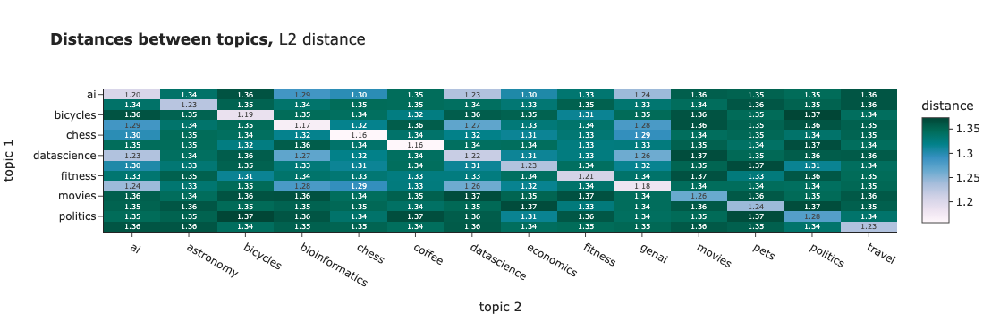

In [61]:
cmp_df = raw_dist_df.pivot_table(index = 'topic1', columns = 'topic2',
                        values = 'l2_distance', aggfunc = 'mean')

fig = px.imshow(cmp_df.values, 
                x = cmp_df.columns,
                y = cmp_df.index,
                text_auto='.2f', aspect="auto",
               labels=dict(x="topic 2", y="topic 1", color="distance"), color_continuous_scale='pubugn',
               title = '<b>Distances between topics,</b> L2 distance', height = 550)
fig.show()

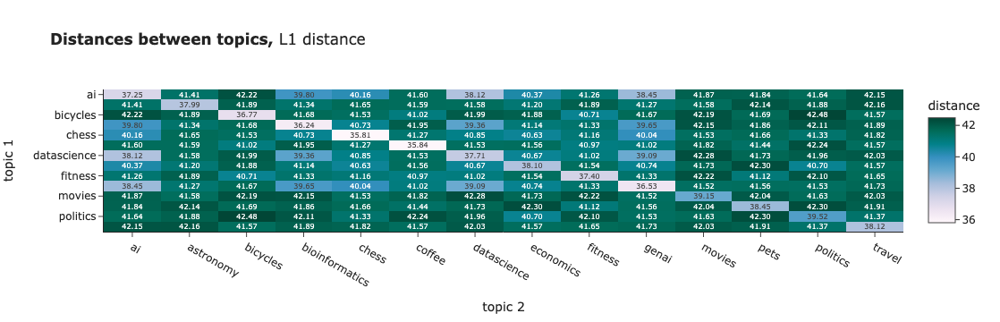

In [62]:
cmp_df = raw_dist_df.pivot_table(index = 'topic1', columns = 'topic2',
                        values = 'l1_distance', aggfunc = 'mean')

fig = px.imshow(cmp_df.values, 
                x = cmp_df.columns,
                y = cmp_df.index,
                text_auto='.2f', aspect="auto",
               labels=dict(x="topic 2", y="topic 1", color="distance"), color_continuous_scale='pubugn',
               title = '<b>Distances between topics,</b> L1 distance', height = 550)
fig.show()

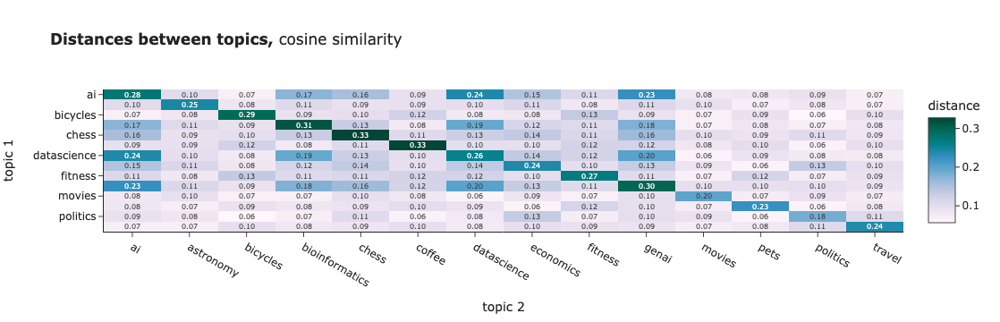

In [63]:
cmp_df = raw_dist_df.pivot_table(index = 'topic1', columns = 'topic2',
                        values = 'cosine_similarity', aggfunc = 'mean')

fig = px.imshow(cmp_df.values, 
                x = cmp_df.columns,
                y = cmp_df.index,
                text_auto='.2f', aspect="auto",
               labels=dict(x="topic 2", y="topic 1", color="distance"), color_continuous_scale='pubugn',
               title = '<b>Distances between topics,</b> cosine similarity', height = 550)
fig.show()

In [141]:
from sklearn.metrics import silhouette_score

In [159]:
silhouette_score(
    X = np.vstack(df.embedding),
    labels = df.topic,
    metric = 'cosine'
)

0.10887295777549842

In [160]:
silhouette_score(
    X = np.vstack(df.embedding),
    labels = df.topic,
    metric = 'l2'
)

0.0577176351509091

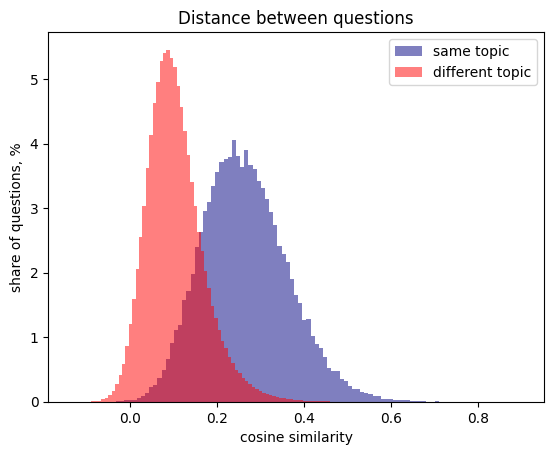

In [64]:
from matplotlib import pyplot

hist_range = None
hist_bins = 100

pyplot.hist(
    raw_dist_df[raw_dist_df.same_topic == 'same topic'].cosine_similarity.values,
    label = 'same topic',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'navy',
    # calculating weights to get normalised histogram
    weights = np.ones_like(raw_dist_df[raw_dist_df.same_topic == 'same topic'].index)*100/raw_dist_df[raw_dist_df.same_topic == 'same topic'].shape[0]
)

pyplot.hist(
    raw_dist_df[raw_dist_df.same_topic == 'different topic'].cosine_similarity.values,
    label = 'different topic',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'red',
    # calculating weights to get normalised histogram
    weights = np.ones_like(raw_dist_df[raw_dist_df.same_topic == 'different topic'].index)*100/raw_dist_df[raw_dist_df.same_topic == 'different topic'].shape[0]
)

pyplot.legend(loc = 'upper right')
pyplot.title('Distance between questions')
pyplot.xlabel('cosine similarity')
pyplot.ylabel('share of questions, %')
pyplot.show()

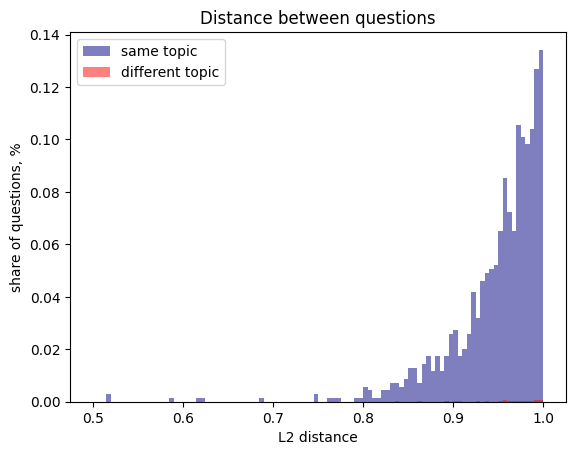

In [65]:
from matplotlib import pyplot

hist_range = [0.5, 1]
hist_bins = 100

pyplot.hist(
    raw_dist_df[raw_dist_df.same_topic == 'same topic'].l2_distance.values,
    label = 'same topic',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'navy',
    # calculating weights to get normalised histogram
    weights = np.ones_like(raw_dist_df[raw_dist_df.same_topic == 'same topic'].index)*100/raw_dist_df[raw_dist_df.same_topic == 'same topic'].shape[0]
)

pyplot.hist(
    raw_dist_df[raw_dist_df.same_topic == 'different topic'].l2_distance.values,
    label = 'different topic',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'red',
    # calculating weights to get normalised histogram
    weights = np.ones_like(raw_dist_df[raw_dist_df.same_topic == 'different topic'].index)*100/raw_dist_df[raw_dist_df.same_topic == 'different topic'].shape[0]
)

pyplot.legend(loc = 'upper left')
pyplot.title('Distance between questions')
pyplot.xlabel('L2 distance')
pyplot.ylabel('share of questions, %')
pyplot.show()

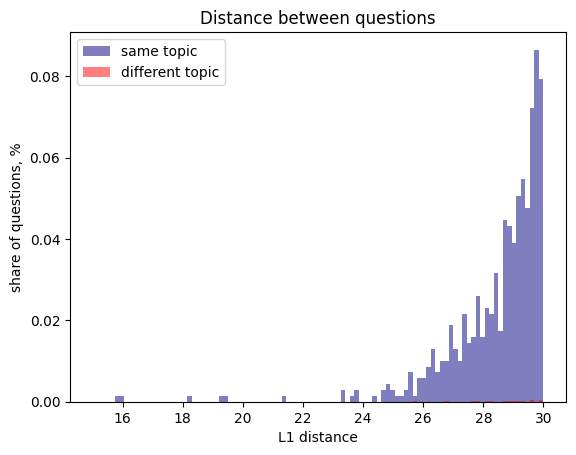

In [66]:
from matplotlib import pyplot

hist_range = [15, 30]
hist_bins = 100

pyplot.hist(
    raw_dist_df[raw_dist_df.same_topic == 'same topic'].l1_distance.values,
    label = 'same topic',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'navy',
    # calculating weights to get normalised histogram
    weights = np.ones_like(raw_dist_df[raw_dist_df.same_topic == 'same topic'].index)*100/raw_dist_df[raw_dist_df.same_topic == 'same topic'].shape[0]
)

pyplot.hist(
    raw_dist_df[raw_dist_df.same_topic == 'different topic'].l1_distance.values,
    label = 'different topic',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'red',
    # calculating weights to get normalised histogram
    weights = np.ones_like(raw_dist_df[raw_dist_df.same_topic == 'different topic'].index)*100/raw_dist_df[raw_dist_df.same_topic == 'different topic'].shape[0]
)

pyplot.legend(loc = 'upper left')
pyplot.title('Distance between questions')
pyplot.xlabel('L1 distance')
pyplot.ylabel('share of questions, %')
pyplot.show()

# Distance vs dimensionality

In [67]:
df['embed_norm'] = df.embedding.map(lambda vector: np.linalg.norm(np.array(vector)))

In [68]:
dim = 2

In [69]:
embedding_distribution_values = embeddings_array.reshape(1, -1)[0]

In [70]:
import random
random.choice(embedding_distribution_values)

0.058151762932538986

<Axes: >

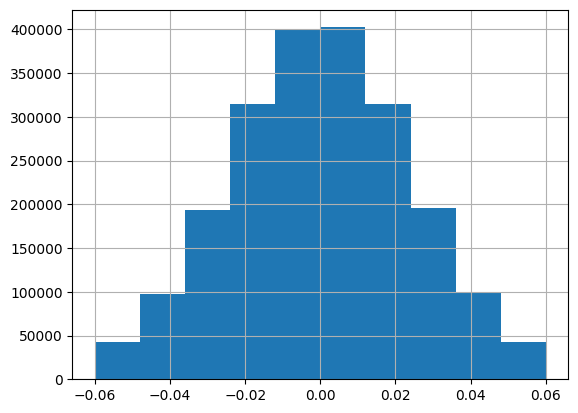

In [71]:
pd.DataFrame(embeddings_array.reshape(1, -1)).T[0].hist(range = (-0.06, 0.06))

In [72]:
def generate_vector(dim, norm = True):
    vector = []
    for i in range(dim):
        vector.append(random.choice(embedding_distribution_values))
    if norm:
        vector = list(map(lambda x: x / np.linalg.norm(np.array(vector)), vector))
    return vector

In [73]:
def generate_samples(n, dim, norm = True):
    tmp_data = []
    for id in range(n):
        tmp_data.append(
            {
                'id': id,
                'embedding': generate_vector(dim, norm)
            }
        )

    return pd.DataFrame(tmp_data).set_index('id')

def get_distances(test_df):
    tmp_data = []
    for id1 in test_df.index.values:
        for id2 in test_df.index.values:
            if id1 == id2:
                continue
                
            vector1 = test_df.loc[id1].embedding
            vector2 = test_df.loc[id2].embedding
    
            tmp_data.append(
                {
                    'id1': id1,
                    'id2': id2,
                    'l2_distance': get_l2_distance(vector1, vector2),
                    'l1_distance': get_l1_distance(vector1, vector2),
                    'cosine_similarity': get_cosine_similarity(vector1, vector2)
                    
                }
            )

    return pd.DataFrame(tmp_data)

In [74]:
tmp_dfs = []

for dim in tqdm.tqdm([5, 10, 50, 100, 500, 1000, 5000, 10000]):
    test_df = generate_samples(300, dim)
    dist_df = get_distances(test_df)
    dist_df['dims'] = dim
    tmp_dfs.append(dist_df)

100%|████████████████████████████████████████████████████████████████████| 8/8 [8:24:47<00:00, 3785.97s/it]


In [75]:
cmp_dist_df = pd.concat(tmp_dfs)

In [76]:
cmp_dist_df.to_csv('distance_simulation_data.csv', index = False, sep = '\t')

In [77]:
def rgb_to_hex(rgb_string):
    # Extract RGB values from the string
    rgb_values = list(map(int, rgb_string[4:-1].split(',')))

    # Convert RGB to hexadecimal
    hex_color = "#{:02x}{:02x}{:02x}".format(*rgb_values)

    return hex_color

dimensions = list(sorted(cmp_dist_df.dims.unique()))
colors = {}
colormap = plotly.colors.sequential.Teal + ['rgb(0,0,0)']
for i in range(len(dimensions)):
    colors[dimensions[i]] = rgb_to_hex(colormap[i])

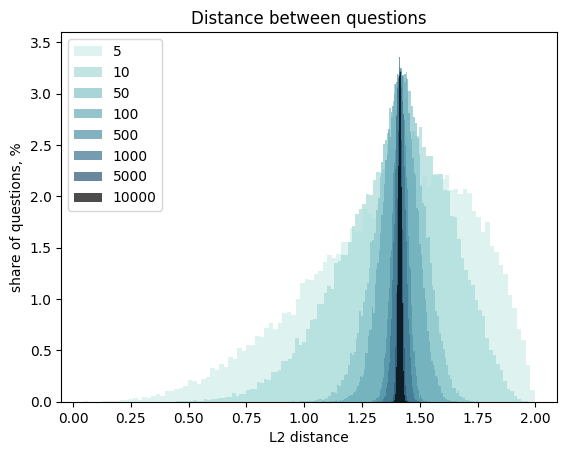

In [78]:
from matplotlib import pyplot

hist_range = None
hist_bins = 100

for dim in cmp_dist_df.dims.unique():
    pyplot.hist(
        cmp_dist_df[cmp_dist_df.dims == dim].l2_distance.values,
        label = dim,
        color = colors[dim],
        alpha = 0.7, range = hist_range, bins = hist_bins,
        # calculating weights to get normalised histogram
        weights = np.ones_like(cmp_dist_df[cmp_dist_df.dims == dim].index)*100/cmp_dist_df[cmp_dist_df.dims == dim].shape[0]
    )

pyplot.legend(loc = 'upper left')
pyplot.title('Distance between questions')
pyplot.xlabel('L2 distance')
pyplot.ylabel('share of questions, %')
pyplot.show()

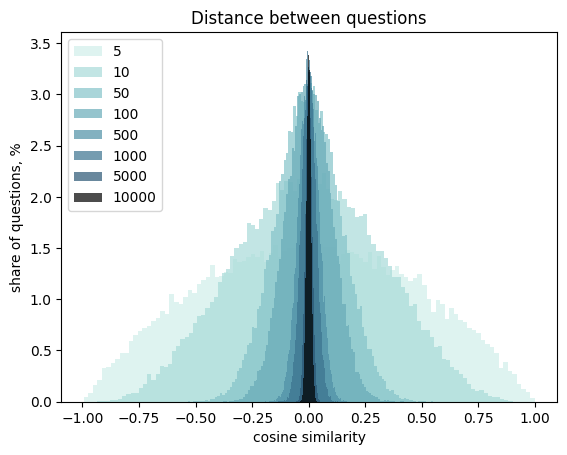

In [79]:
from matplotlib import pyplot

hist_range = None
hist_bins = 100

for dim in cmp_dist_df.dims.unique():
    pyplot.hist(
        cmp_dist_df[cmp_dist_df.dims == dim].cosine_similarity.values,
        label = dim,
        alpha = 0.7, range = hist_range, bins = hist_bins,
        color = colors[dim],
        # calculating weights to get normalised histogram
        weights = np.ones_like(cmp_dist_df[cmp_dist_df.dims == dim].index)*100/cmp_dist_df[cmp_dist_df.dims == dim].shape[0]
    )

pyplot.legend(loc = 'upper left')
pyplot.title('Distance between questions')
pyplot.xlabel('cosine similarity')
pyplot.ylabel('share of questions, %')
pyplot.show()

In [80]:
tmp_df = cmp_dist_df.copy()

In [81]:
tmp_df['cosine_similarity'] = tmp_df['cosine_similarity'].map(lambda x: round(x, 3))

### Bar codes

In [166]:
raw_dist_df[raw_dist_df.id1 == 1].sort_values('cosine_similarity').head(3)

,id1,id2,topic1,topic2,l2_distance,l1_distance,dot_product,cosine_similarity,same_topic
747,1,749,ai,bicycles,1.482563,46.055781,-0.098997,-0.098997,different topic
770,1,772,ai,bicycles,1.470273,45.216161,-0.080852,-0.080852,different topic
896,1,898,ai,travel,1.470198,45.507444,-0.080741,-0.080741,different topic


In [167]:
raw_dist_df[raw_dist_df.id1 == 1].sort_values('cosine_similarity').tail(3)

,id1,id2,topic1,topic2,l2_distance,l1_distance,dot_product,cosine_similarity,same_topic
614,1,616,ai,genai,1.086270,33.676835,0.410009,0.410009,different topic
649,1,651,ai,genai,1.083736,33.461882,0.412758,0.412758,different topic
82,1,84,ai,ai,1.074277,33.204710,0.422965,0.422965,same topic


In [168]:
embedding1 = df.loc[1].embedding
embedding2 = df.loc[616].embedding
embedding3 = df.loc[749].embedding

In [169]:
len(embedding1)

1536

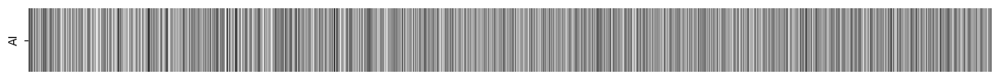

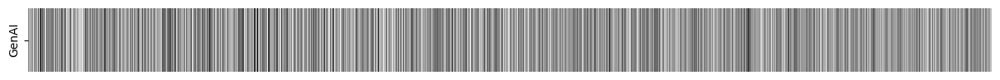

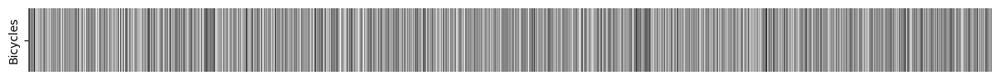

In [174]:
import seaborn as sns
import matplotlib.pyplot as plt
embed_len_thr = 1536

sns.heatmap(np.array(embedding1[:embed_len_thr]).reshape(-1, embed_len_thr),cmap="Greys",center=0,square=False, xticklabels=False, 
           cbar=False)
plt.gcf().set_size_inches(15,1)
plt.yticks([0.5], labels = ['AI'])
plt.show()

sns.heatmap(np.array(embedding3[:embed_len_thr]).reshape(-1, embed_len_thr),cmap="Greys",center=0,square=False, xticklabels=False, 
           cbar=False)
plt.gcf().set_size_inches(15,1)
plt.yticks([0.5], labels = ['GenAI'])
plt.show()

sns.heatmap(np.array(embedding2[:embed_len_thr]).reshape(-1, embed_len_thr),cmap="Greys",center=0,square=False, xticklabels=False, 
           cbar=False)
plt.gcf().set_size_inches(15,1)
plt.yticks([0.5], labels = ['Bicycles'])
plt.show()

# Applications

### Classification

In [87]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

In [88]:
class_model = RandomForestClassifier(max_depth = 10)

In [89]:
X = embeddings_array
y = df.topic

In [90]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state = 42, test_size=0.2, stratify=y
)

In [91]:
class_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

In [92]:
y_pred = class_model.predict(X_test)

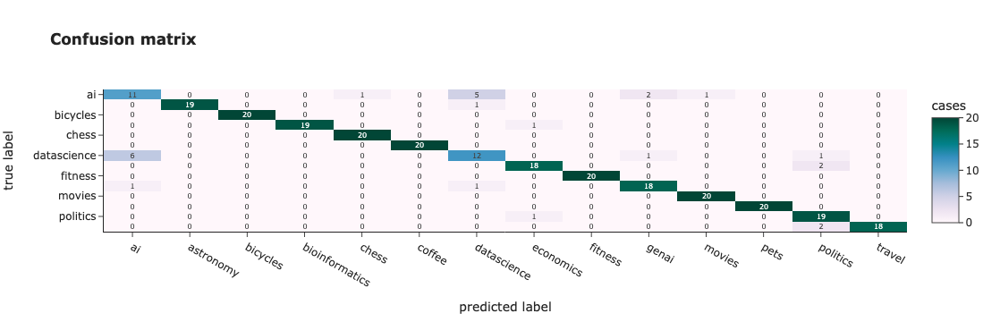

In [93]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

fig = px.imshow(cm, 
                x = class_model.classes_,
                y = class_model.classes_,
                text_auto='d', aspect="auto",
               labels=dict(x="predicted label", y="true label", color="cases"), color_continuous_scale='pubugn',
               title = '<b>Confusion matrix</b>', height = 550)
fig.show()

### Clusterisation

In [180]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []
for k in tqdm.tqdm(range(2, 51)):
    kmeans = KMeans(n_clusters=k, 
                    random_state=42, 
                    n_init = 'auto').fit(embeddings_array)
    kmeans_labels = kmeans.labels_
    silhouette_scores.append(
        {
            'k': k,
            'silhouette_score': silhouette_score(embeddings_array, kmeans_labels, metric = 'cosine')
        }
    )

100%|██████████████████████████████████████████████████████████████████████| 49/49 [00:14<00:00,  3.47it/s]


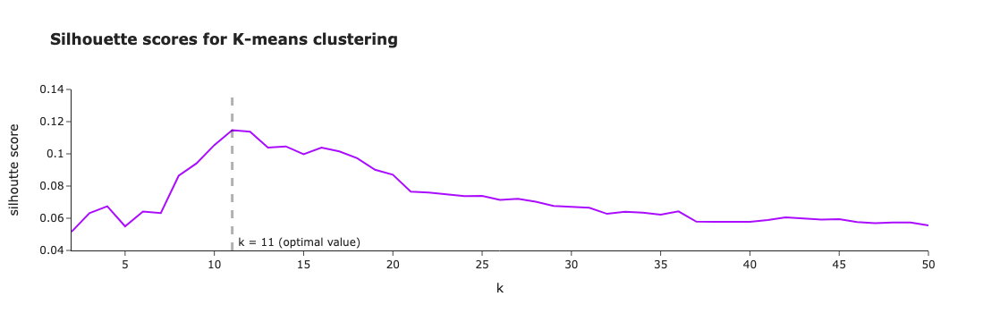

In [214]:
fig = px.line(pd.DataFrame(silhouette_scores).set_index('k'),
       title = '<b>Silhouette scores for K-means clustering</b>',
       labels = {'value': 'silhoutte score'}, color_discrete_sequence = plotly.colors.qualitative.Alphabet)

fig.add_vline(
    x=11, line_width=3, line_dash="dash", 
    line_color='black', annotation_text=" k = 11 (optimal value)", 
    annotation_position="bottom right"
)

fig.update_layout(showlegend = False)
fig.update_yaxes(range = [0.04, 0.14])

In [187]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

kmeans = KMeans(n_clusters=11, 
                random_state=42, 
                n_init = 'auto').fit(embeddings_array)

kmeans_labels = kmeans.labels_
tsne_model = TSNE(n_components=2, random_state=42)
tsne_embeddings_values = tsne_model.fit_transform(embeddings_array)

In [188]:
kmeans_labels

array([3, 3, 3, ..., 9, 9, 9], dtype=int32)

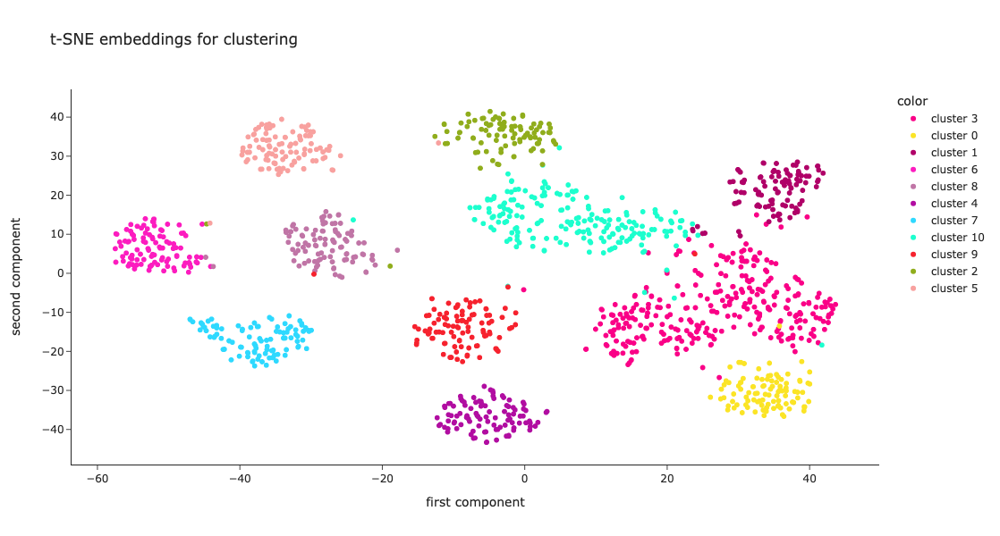

In [189]:
fig = px.scatter(
    x = tsne_embeddings_values[:,0], 
    y = tsne_embeddings_values[:,1],
    color = list(map(lambda x: 'cluster %s' % x, kmeans_labels)),
    hover_name = df.full_text.values,
    title = 't-SNE embeddings for clustering', width = 800, height = 600,
    color_discrete_sequence = plotly.colors.qualitative.Alphabet_r
)
fig.update_layout(xaxis_title = 'first component', yaxis_title = 'second component')
fig.show()

In [190]:
df['cluster'] = list(map(lambda x: 'cluster %s' % x, kmeans_labels))

In [191]:
cluster_stats_df = df.reset_index().pivot_table(index = 'cluster', values = 'id', aggfunc = 'count', columns = 'topic')\
    .fillna(0).applymap(int)

In [192]:
cluster_stats_df = cluster_stats_df.apply(lambda x: 100*x/cluster_stats_df.sum(axis = 1))

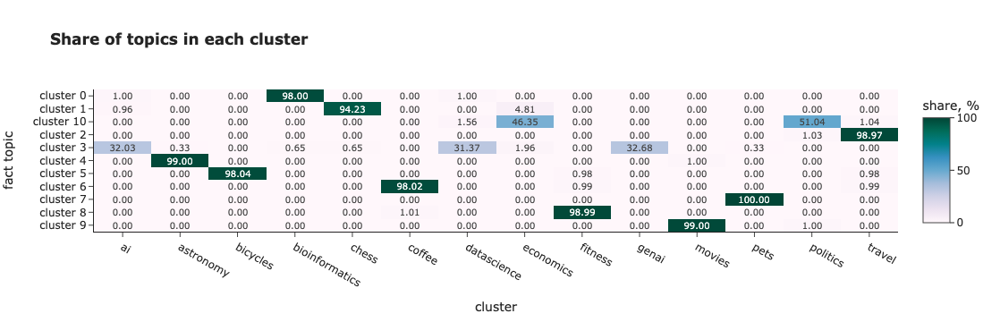

In [193]:
fig = px.imshow(cluster_stats_df.values, 
                x = cluster_stats_df.columns,
                y = cluster_stats_df.index,
                text_auto='.2f', aspect="auto",
               labels=dict(x="cluster", y="fact topic", color="share, %"), color_continuous_scale='pubugn',
               title = '<b>Share of topics in each cluster</b>', height = 550)
fig.show()

In [101]:
### Finding anomalies

In [102]:
topic_df = df[df.topic == 'travel']
topic_embeddings_array = np.array(topic_df.embedding.values.tolist())

In [103]:
from sklearn.ensemble import IsolationForest
clf = IsolationForest(contamination = 0.01, random_state = 42) 

topic_df['is_anomaly'] = clf.fit_predict(topic_embeddings_array)

In [104]:
topic_df[topic_df.is_anomaly == -1][['full_text']]

,full_text
id,
836,"Handshake while holding own right elbow\nI have recently had contact with an acquaintance from Eastern Africa (I think from Ethiopia or Somalia). When the person greeted me, she shook my hand while holding her elbow of the right arm with the left hand (see image). After this happened a few times, I figured it was not just a coincidence.\nDoes this gesture have any meaning?\n\n"


In [105]:
print('Is it safe to drink the water from the fountains found all over the older parts of Rome?\nWhen I visited Rome and walked around the older sections, I saw many different types of fountains that were constantly running with water. Some went into the ground, some collected in basins, etc.\nIs the water coming out of these fountains potable? Safe for visitors to drink from? Any etiquette regarding their use that a visitor should know about?\nThese are the fountains known as nasoni (or "large noses")')

Is it safe to drink the water from the fountains found all over the older parts of Rome?
When I visited Rome and walked around the older sections, I saw many different types of fountains that were constantly running with water. Some went into the ground, some collected in basins, etc.
Is the water coming out of these fountains potable? Safe for visitors to drink from? Any etiquette regarding their use that a visitor should know about?
These are the fountains known as nasoni (or "large noses")


In [106]:
topic_df.is_anomaly.value_counts()

is_anomaly
 1    99
-1     1
Name: count, dtype: int64